In [2]:
import rasterio
from rasterio.enums import Resampling
import os
import numpy as np
from rasterio.plot import show
import matplotlib.pyplot as plt
from earthpy.spatial import normalized_diff
from rasterio.windows import Window


No GRANULE directory found in C:\Users\hamza\Downloads\ImageProcessing\cutImages
(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20200509T094041.tif


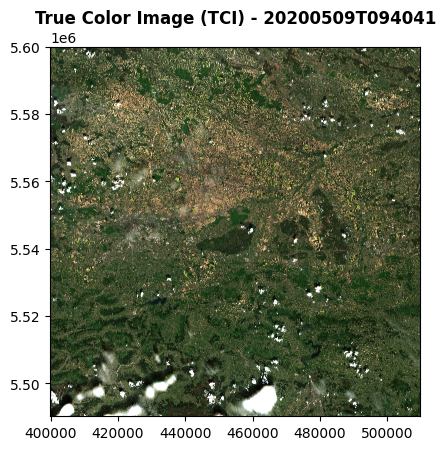

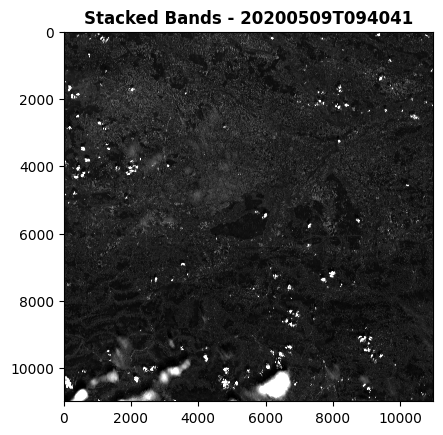

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20200701T095031.tif


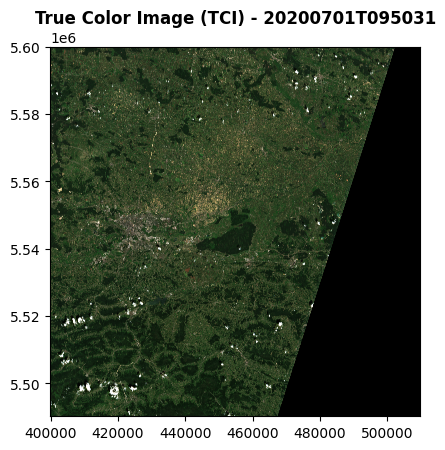

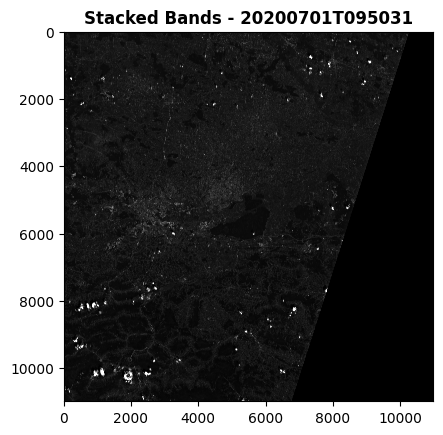

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20210713T094031.tif


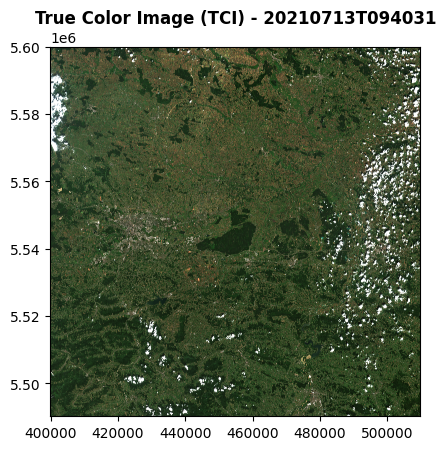

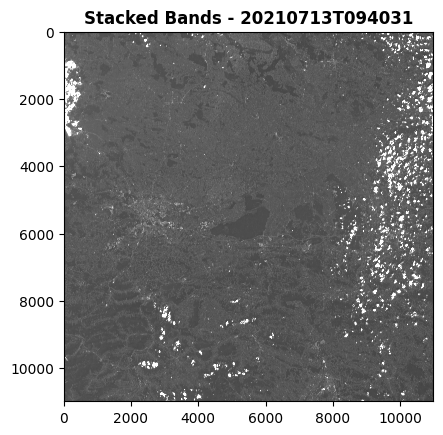

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20240617T094041.tif


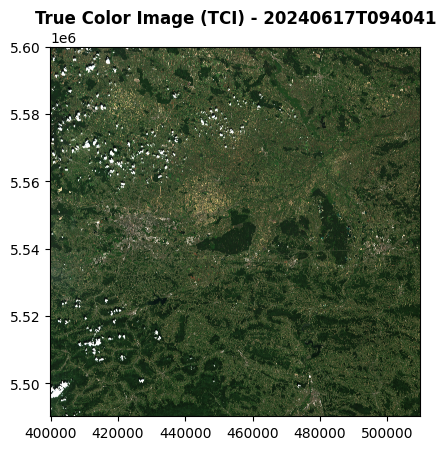

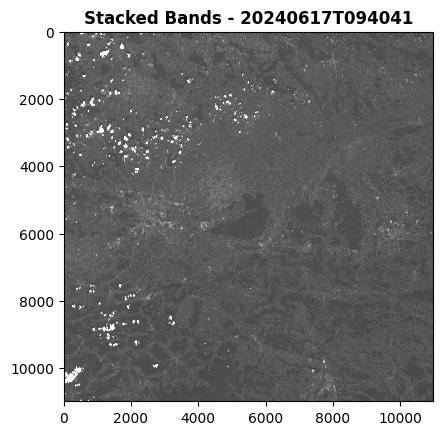

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20220626T095039.tif


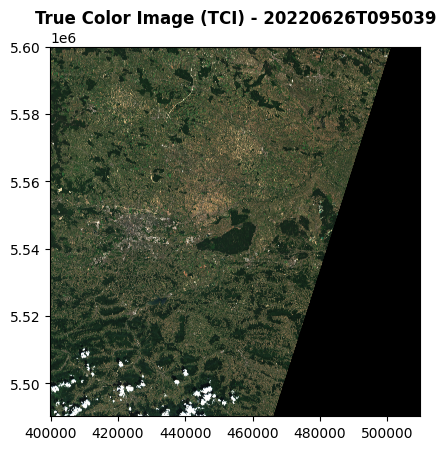

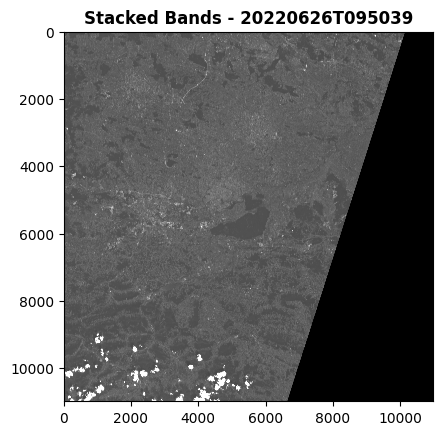

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20230708T093549.tif


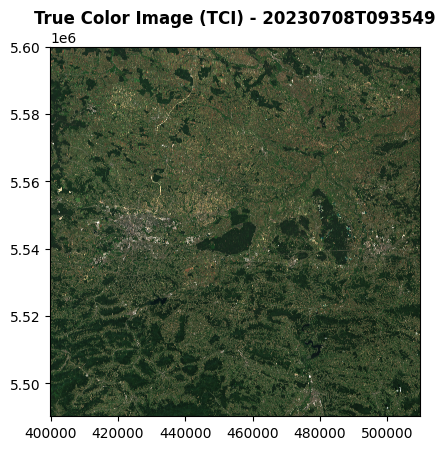

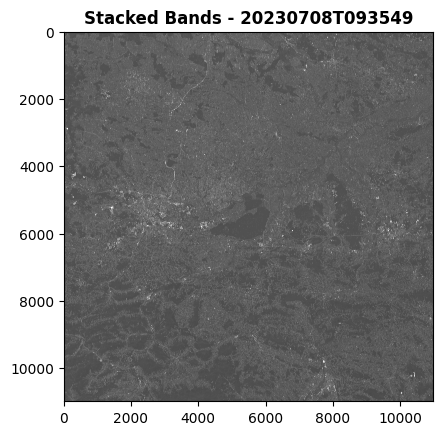

(1, 10980, 10980)
(6, 10980, 10980)
Stacked bands (excluding TCI) saved at: C:\Users\hamza\Downloads\ImageProcessing\stackedBands\20240327T094619.tif


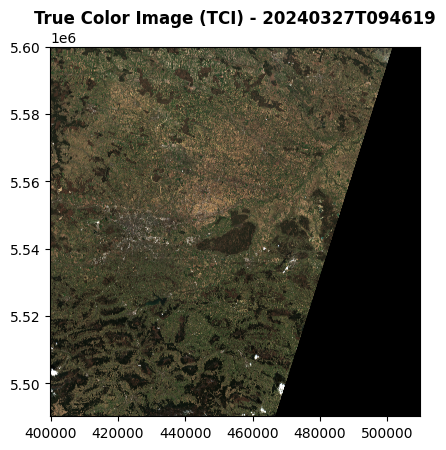

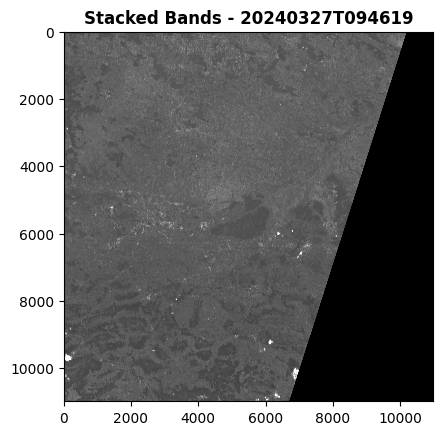

No GRANULE directory found in C:\Users\hamza\Downloads\ImageProcessing\stackedBands


In [3]:

# Define the path to the directory containing the band files
base_path = r'C:\Users\hamza\Downloads\ImageProcessing'

# Folder to save stacked bands
output_folder = os.path.join(base_path, 'stackedBands')

# List all satellite data folders
satellite_folders = [
    os.path.join(base_path, folder) 
    for folder in os.listdir(base_path) 
    if os.path.isdir(os.path.join(base_path, folder))
]

# Loop through each satellite data folder
for satellite_folder in satellite_folders:
    # Find the GRANULE directory
    granule_dir = os.path.join(satellite_folder, 'GRANULE')
    
    # Check if GRANULE directory exists in the immediate folder
    if not os.path.exists(granule_dir):
        # If not found, search for GRANULE directory in the next level of nesting
        sub_folders = os.listdir(satellite_folder)
        for sub_folder in sub_folders:
            sub_folder_path = os.path.join(satellite_folder, sub_folder)
            if os.path.isdir(sub_folder_path):
                granule_dir = os.path.join(sub_folder_path, 'GRANULE')
                if os.path.exists(granule_dir):
                    break
    
    # If GRANULE directory still not found, print message and continue to next folder
    if not os.path.exists(granule_dir):
        print(f"No GRANULE directory found in {satellite_folder}")
        continue

    # Extract timestamp from folder name
    if "MSIL2A" in satellite_folder:
        timestamp = satellite_folder.split('_')[2]
    else:
        timestamp = satellite_folder.split('_')[1]

    # Get the first folder inside GRANULE
    granule_subdirs = next(os.walk(granule_dir), (None, [], None))[1]  # Handle empty directory
    if granule_subdirs:
        granule_subdir = os.path.join(granule_dir, granule_subdirs[0])

        # Construct path for 10m and 20m bands
        path_10m = os.path.join(granule_subdir, 'IMG_DATA', 'R10m')
        path_20m = os.path.join(granule_subdir, 'IMG_DATA', 'R20m')

        # Read each band separately
        B02 = rasterio.open(os.path.join(path_10m, f"T34UDA_{timestamp}_B02_10m.jp2"))  # Blue
        B03 = rasterio.open(os.path.join(path_10m, f"T34UDA_{timestamp}_B03_10m.jp2"))  # Green
        B04 = rasterio.open(os.path.join(path_10m, f"T34UDA_{timestamp}_B04_10m.jp2"))  # Red
        B08 = rasterio.open(os.path.join(path_10m, f"T34UDA_{timestamp}_B08_10m.jp2"))  # NIR
        B11 = rasterio.open(os.path.join(path_20m, f"T34UDA_{timestamp}_B11_20m.jp2"))  # SWIR 1
        B12 = rasterio.open(os.path.join(path_20m, f"T34UDA_{timestamp}_B12_20m.jp2"))  # SWIR 2
        TCI = rasterio.open(os.path.join(path_10m, f"T34UDA_{timestamp}_TCI_10m.jp2"))  # True Color Image

        # Read each band as numpy arrays
        B02_np = B02.read()
        B03_np = B03.read()
        B04_np = B04.read()
        B08_np = B08.read()
        B11_np = B11.read(
            out_shape=(B11.count, int(B11.height * 2), int(B11.width * 2)),
            resampling=Resampling.bilinear
        )
        B12_np = B12.read(
            out_shape=(B12.count, int(B12.height * 2), int(B12.width * 2)),
            resampling=Resampling.bilinear
        )

        # Check the shape of images
        print(B02_np.shape)

        # Stack all bands
        image_all_bands = np.concatenate((B02_np, B03_np, B04_np, B08_np, B11_np, B12_np), axis=0)
        print(image_all_bands.shape)

        # Save image with georeference
        stacked_path = os.path.join(output_folder, f'{timestamp}.tif')
        out_meta = B02.meta.copy()  # Copy metadata from one of the 10m bands
        out_meta.update(count=image_all_bands.shape[0])  # Update metadata to reflect the number of bands

        with rasterio.open(stacked_path, 'w', **out_meta) as dst:
            dst.write(image_all_bands)

        # Print confirmation
        print(f"Stacked bands (excluding TCI) saved at: {stacked_path}")

        # Show TCI with timestamp in the title
        show(TCI, title=f'True Color Image (TCI) - {timestamp}')

        # Show stacked bands image with timestamp in the title
        show(image_all_bands[0, :, :], cmap='gray', vmin=0, vmax=4000, title=f'Stacked Bands - {timestamp}')
    else:
        print(f"No GRANULE directory found in {satellite_folder}")


Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20200509T094041_cropped.tif


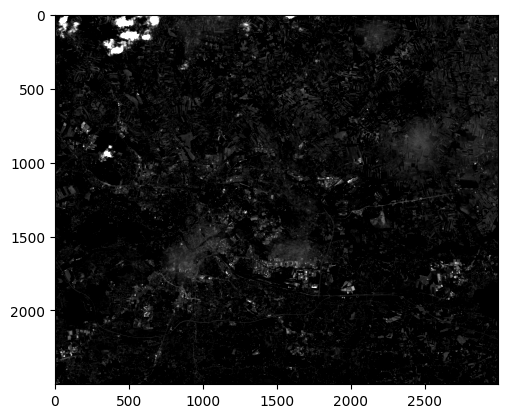

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20200701T095031_cropped.tif


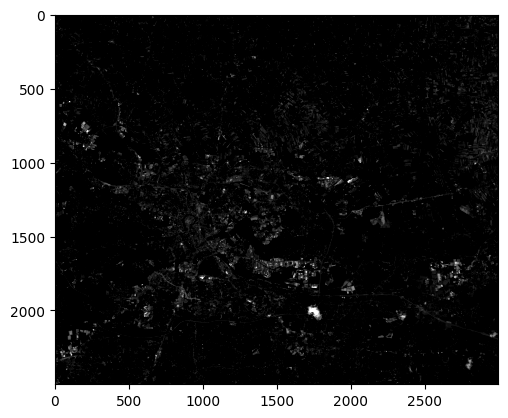

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20210713T094031_cropped.tif


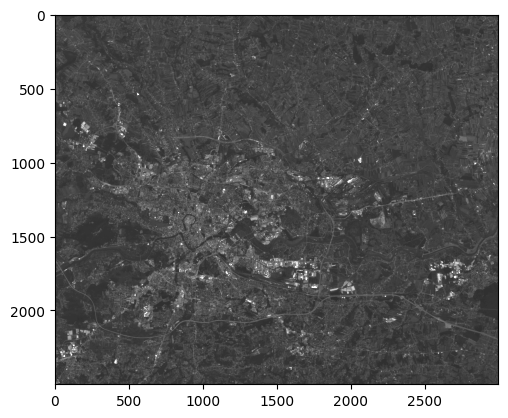

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20220626T095039_cropped.tif


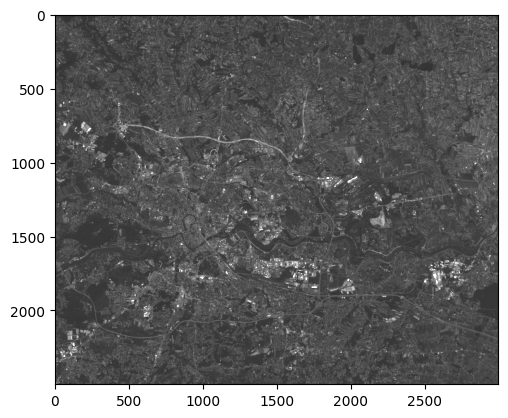

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20230708T093549_cropped.tif


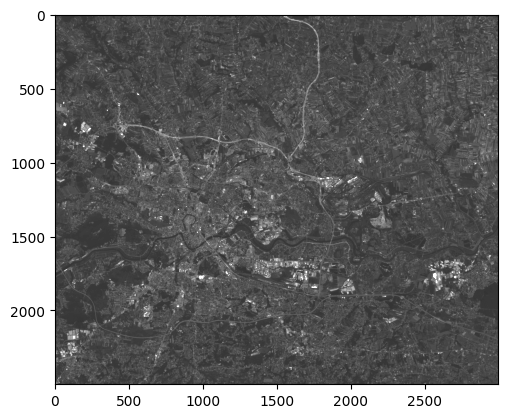

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20240327T094619_cropped.tif


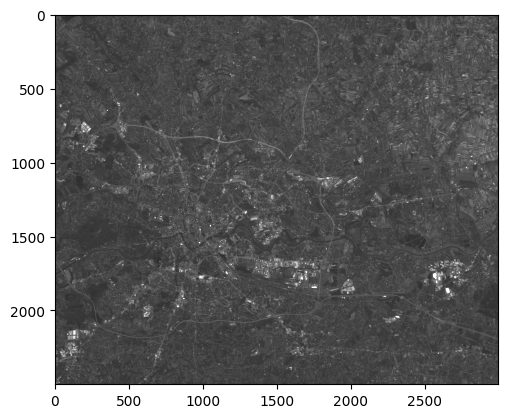

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}
Cropped image saved at: C:\Users\hamza\Downloads\ImageProcessing\cutImages\20240617T094041_cropped.tif


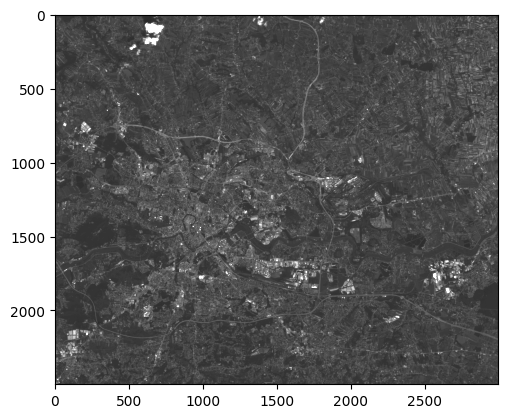

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}


In [4]:


# Define the path to the directory containing the stacked band files
stacked_bands_folder = r'C:\Users\hamza\Downloads\ImageProcessing\stackedBands'

# Folder to save cropped images
output_folder = r'C:\Users\hamza\Downloads\ImageProcessing\cutImages'

# List all stacked band files
stacked_band_files = [
    os.path.join(stacked_bands_folder, file) 
    for file in os.listdir(stacked_bands_folder) 
    if file.endswith('.tif')
]

# Loop through each stacked band file
for stacked_band_file in stacked_band_files:
    # Open the stacked band file
    with rasterio.open(stacked_band_file) as src:
        # Define the window parameters
        xsize, ysize = 3000, 2500  # Size of the desired window
        xoff, yoff = 1500, 4000    # Start point of the window

        # Create a Window and calculate the transform from the source dataset
        window = Window(xoff, yoff, xsize, ysize)
        transform = src.window_transform(window)

        # Create a new cropped raster profile
        profile = src.profile
        profile.update({
            'driver': 'GTiff',
            'height': ysize,
            'width': xsize,
            'transform': transform
        })

        # Define the output file path
        output_file = os.path.join(output_folder, f"{os.path.splitext(os.path.basename(stacked_band_file))[0]}_cropped.tif")

        # Open the output file for writing
        with rasterio.open(output_file, 'w', **profile) as dst:
            # Read the data from the window and write it to the output raster
            dst.write(src.read(window=window))

        # Print confirmation
        print(f"Cropped image saved at: {output_file}")

        # Open the cropped image for visualization
        with rasterio.open(output_file) as img_cropped:
            # Display the cropped image
            show(img_cropped, 0, cmap='gray', vmin=500, vmax=4000)
            # Print the metadata of the cropped image
            meta_img_cropped = img_cropped.meta
            print(meta_img_cropped)


Cropped image shape: (6, 2500, 3000)
1208.0 2508.0099999997765 1308.0 2706.0 1278.0 2943.0 1514.0 4980.0 1740.0 4113.0 1560.9900000000052 3834.0


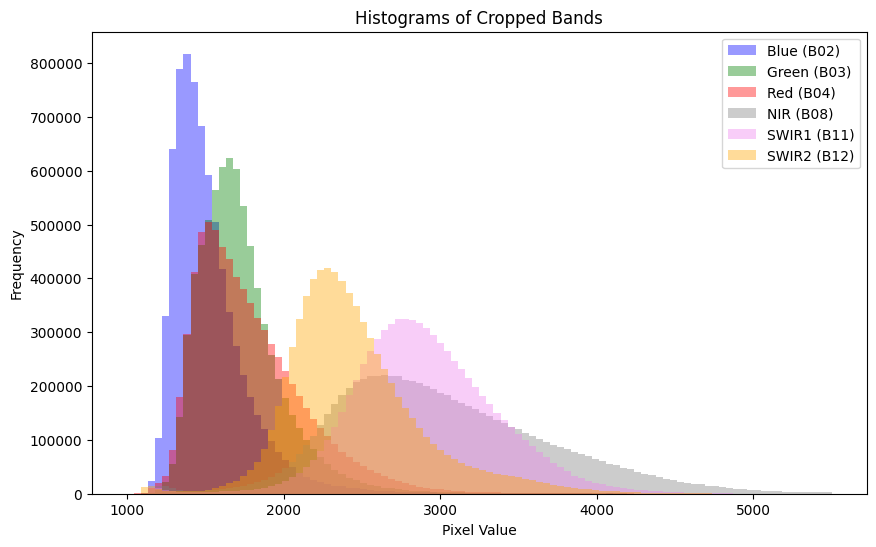

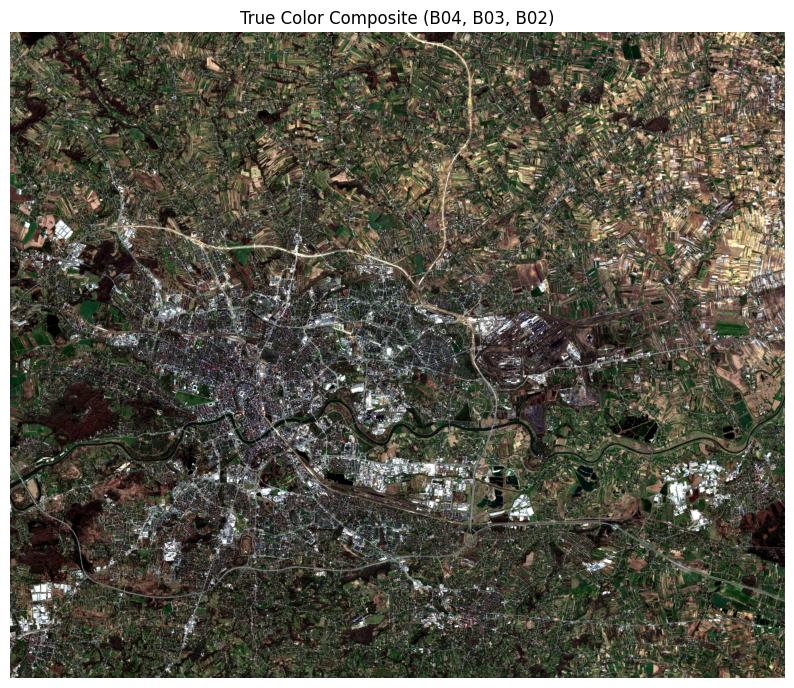

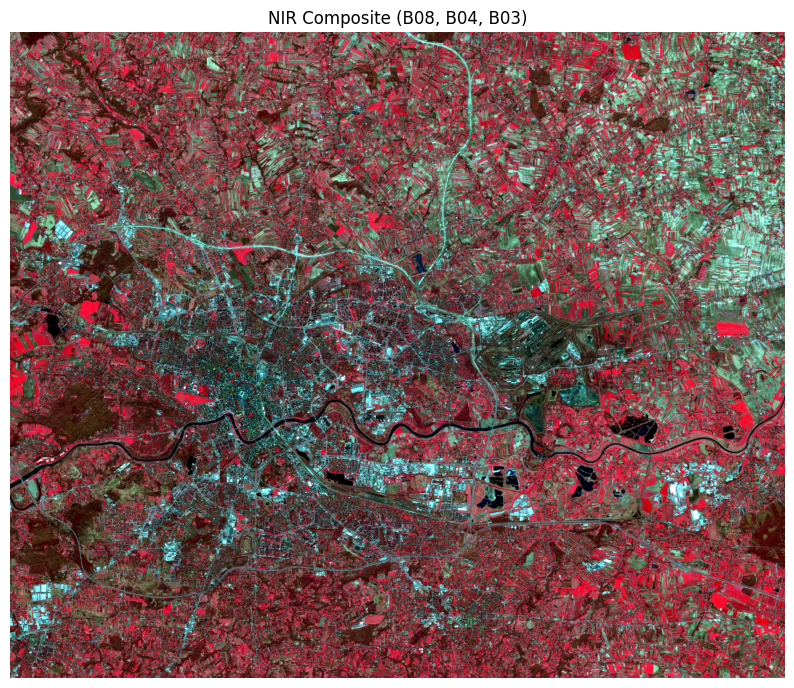

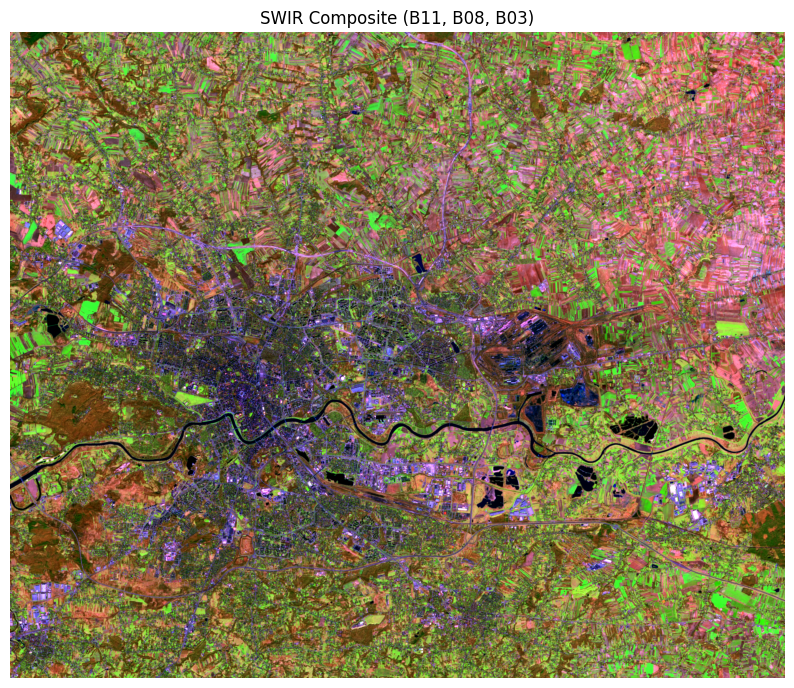

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 3000, 'height': 2500, 'count': 6, 'crs': CRS.from_epsg(32634), 'transform': Affine(10.0, 0.0, 414960.0,
       0.0, -10.0, 5560040.0)}


In [5]:



# Define the path to the cropped image
cropped_path = r'C:\Users\hamza\Downloads\ImageProcessing\cutImages\20240327T094619_cropped.tif'

# Open the cropped raster
img_cropped = rasterio.open(cropped_path)

# Read bands from the cropped image
img_cropped_np = img_cropped.read()
print("Cropped image shape:", img_cropped_np.shape)

# Function to convert uint16 to uint8 for visualization
def uint16to8(image):
    image = image.astype(float)
    vmaxB2 = np.quantile(image[0,:,:].flatten(), 0.99)
    vminB2 = np.quantile(image[0,:,:].flatten(), 0.01)
    vmaxB3 = np.quantile(image[1,:,:].flatten(), 0.99)
    vminB3 = np.quantile(image[1,:,:].flatten(), 0.01)
    vmaxB4 = np.quantile(image[2,:,:].flatten(), 0.99)
    vminB4 = np.quantile(image[2,:,:].flatten(), 0.01)
    vmaxB8 = np.quantile(image[3,:,:].flatten(), 0.99)
    vminB8 = np.quantile(image[3,:,:].flatten(), 0.01)
    vmaxB11 = np.quantile(image[4,:,:].flatten(), 0.99)
    vminB11 = np.quantile(image[4,:,:].flatten(), 0.01)
    vmaxB12 = np.quantile(image[5,:,:].flatten(), 0.99)
    vminB12 = np.quantile(image[5,:,:].flatten(), 0.01)

    print(vminB2, vmaxB2, vminB3, vmaxB3, vminB4, vmaxB4, vminB8, vmaxB8, vminB11, vmaxB11, vminB12, vmaxB12)

    image[0,:,:] = (image[0,:,:] - vminB2) / (vmaxB2 - vminB2)
    image[1,:,:] = (image[1,:,:] - vminB3) / (vmaxB3 - vminB3)
    image[2,:,:] = (image[2,:,:] - vminB4) / (vmaxB4 - vminB4)
    image[3,:,:] = (image[3,:,:] - vminB8) / (vmaxB8 - vminB8)
    image[4,:,:] = (image[4,:,:] - vminB11) / (vmaxB11 - vminB11)
    image[5,:,:] = (image[5,:,:] - vminB12) / (vmaxB12 - vminB12)

    image[image < 0] = 0
    image[image > 1] = 1
    image = (image * 255).astype(np.uint8)

    return image

# Convert the image data to uint8 for visualization
img_uint8 = uint16to8(img_cropped_np)

# Plot histograms for the original uint16 data
plt.figure(figsize=(10, 6))
plt.hist(img_cropped_np[0, :, :].flatten(), range=(1000, 5500), bins=100, color='blue', alpha=0.4, label='Blue (B02)')
plt.hist(img_cropped_np[1, :, :].flatten(), range=(1000, 5500), bins=100, color='green', alpha=0.4, label='Green (B03)')
plt.hist(img_cropped_np[2, :, :].flatten(), range=(1000, 5500), bins=100, color='red', alpha=0.4, label='Red (B04)')
plt.hist(img_cropped_np[3, :, :].flatten(), range=(1000, 5500), bins=100, color='gray', alpha=0.4, label='NIR (B08)')
plt.hist(img_cropped_np[4, :, :].flatten(), range=(1000, 5500), bins=100, color='violet', alpha=0.4, label='SWIR1 (B11)')
plt.hist(img_cropped_np[5, :, :].flatten(), range=(1000, 5500), bins=100, color='orange', alpha=0.4, label='SWIR2 (B12)')

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histograms of Cropped Bands')
plt.legend()
plt.show()

# Visualize true color composite (uint8)
img_cropped_RGB = img_uint8[(2, 1, 0), :, :]
img_cropped_RGB = img_cropped_RGB.transpose(1, 2, 0)  # Rearrange dimensions for visualization

plt.figure(figsize=(10, 10))
plt.imshow(img_cropped_RGB)
plt.title('True Color Composite (B04, B03, B02)')
plt.axis('off')
plt.show()

# Function to create and visualize other color composites (uint8)
def visualize_composite(bands, title):
    composite = img_uint8[bands, :, :].transpose(1, 2, 0)
    plt.figure(figsize=(10, 10))
    plt.imshow(composite)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Visualize NIR and SWIR composites (uint8)
visualize_composite((3, 2, 1), 'NIR Composite (B08, B04, B03)')
visualize_composite((4, 3, 1), 'SWIR Composite (B11, B08, B03)')

# Print metadata of the cropped raster for verification
meta_img_cropped = img_cropped.meta
print(meta_img_cropped)


Green space percentage for 20200509T094041_cropped.tif: 89.52%


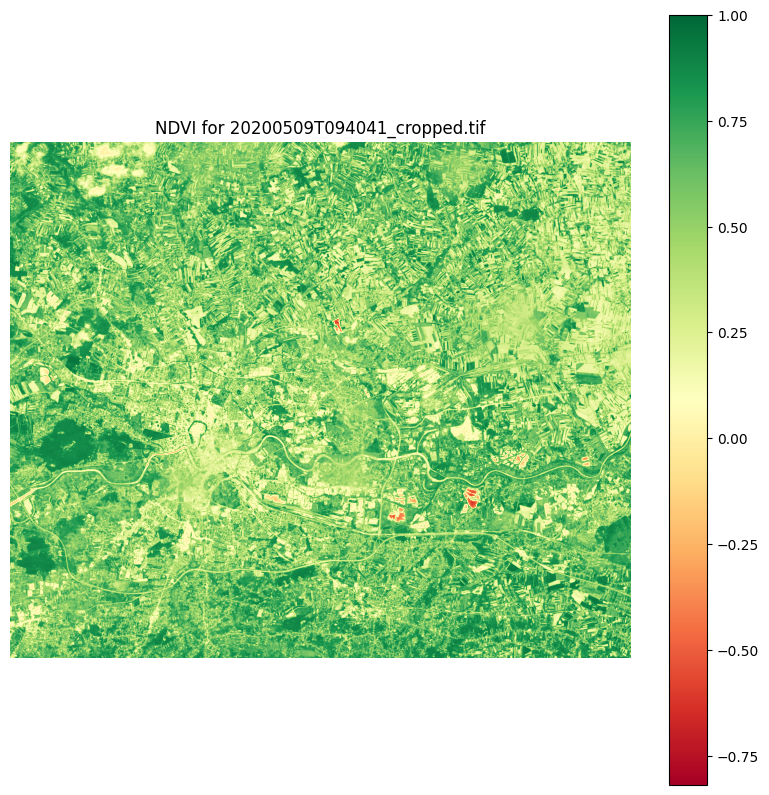

Green space percentage for 20200701T095031_cropped.tif: 93.17%


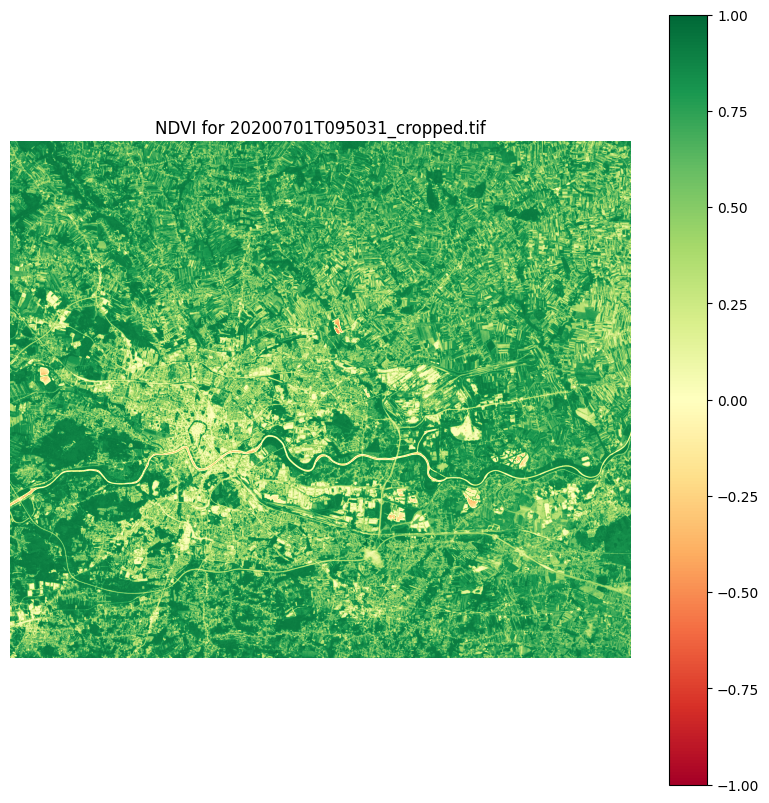

Green space percentage for 20210713T094031_cropped.tif: 87.53%


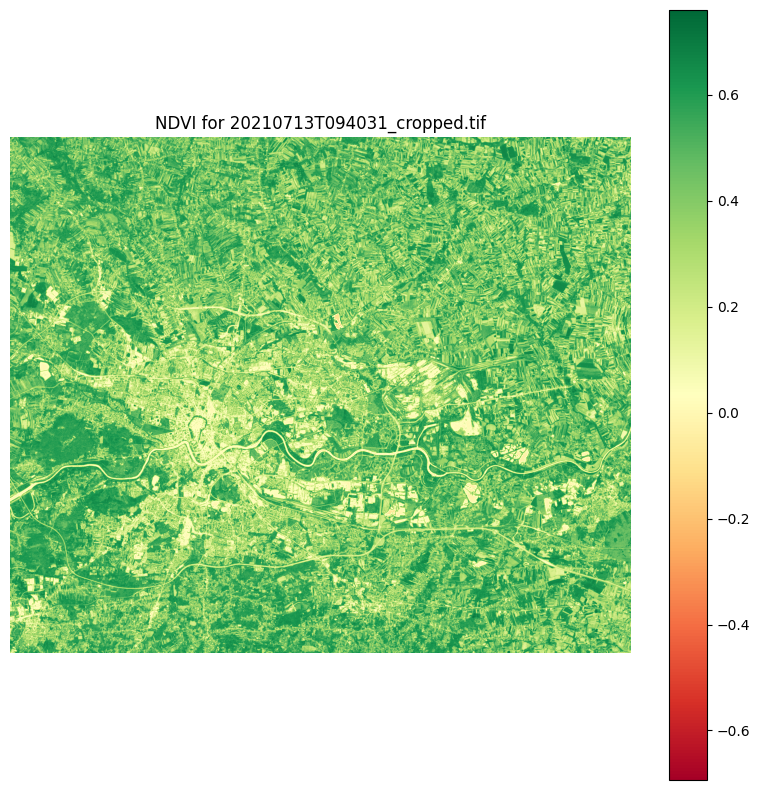

Green space percentage for 20220626T095039_cropped.tif: 84.55%


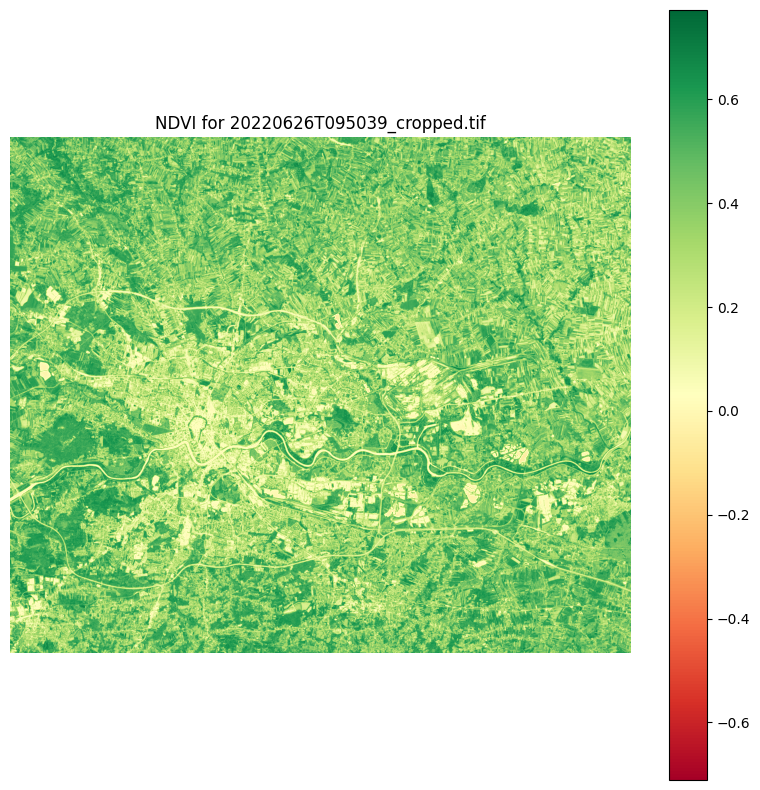

Green space percentage for 20230708T093549_cropped.tif: 87.34%


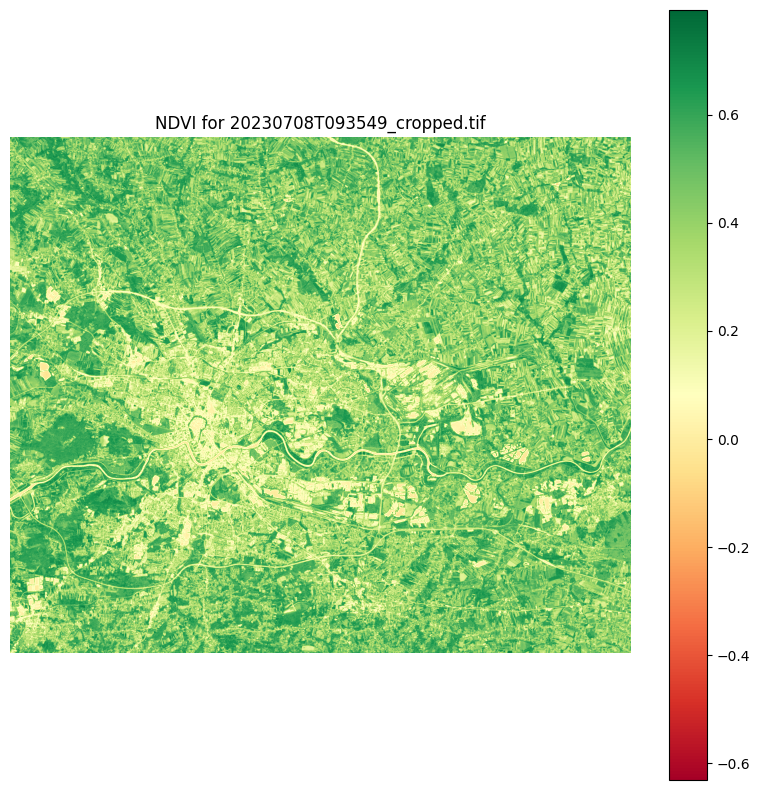

Green space percentage for 20240327T094619_cropped.tif: 62.33%


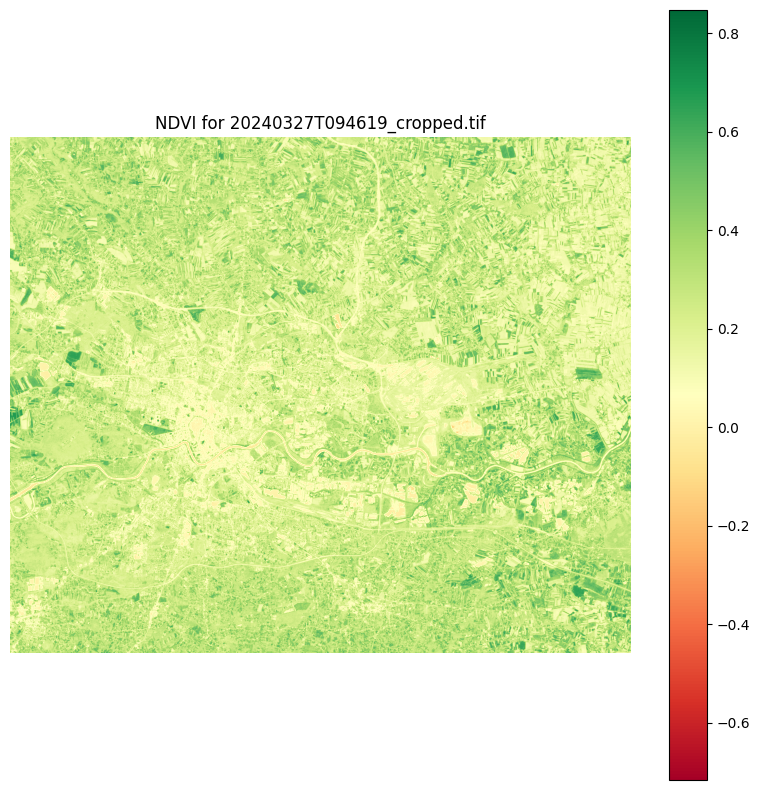

Green space percentage for 20240617T094041_cropped.tif: 86.58%


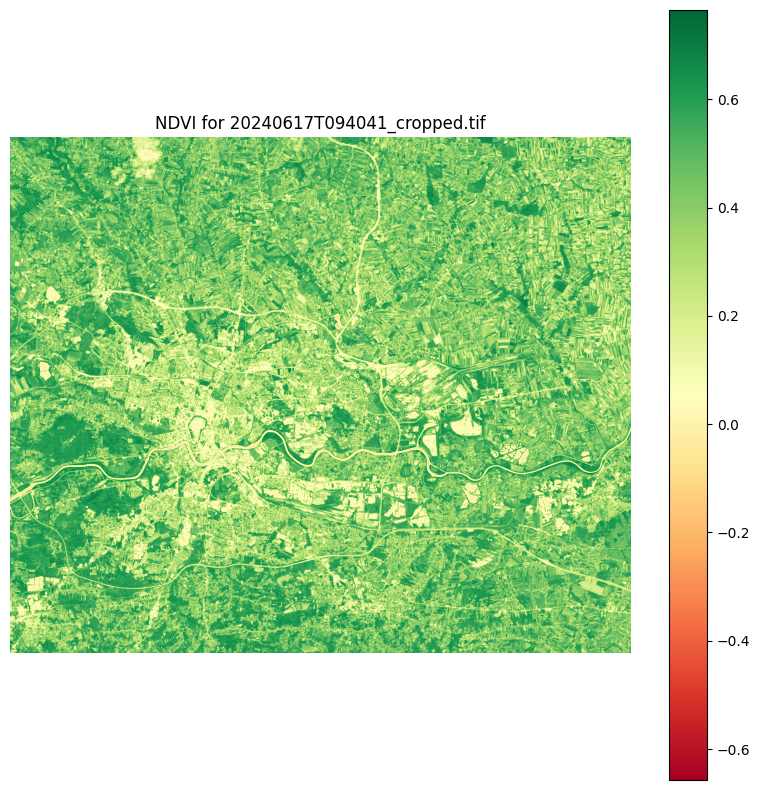

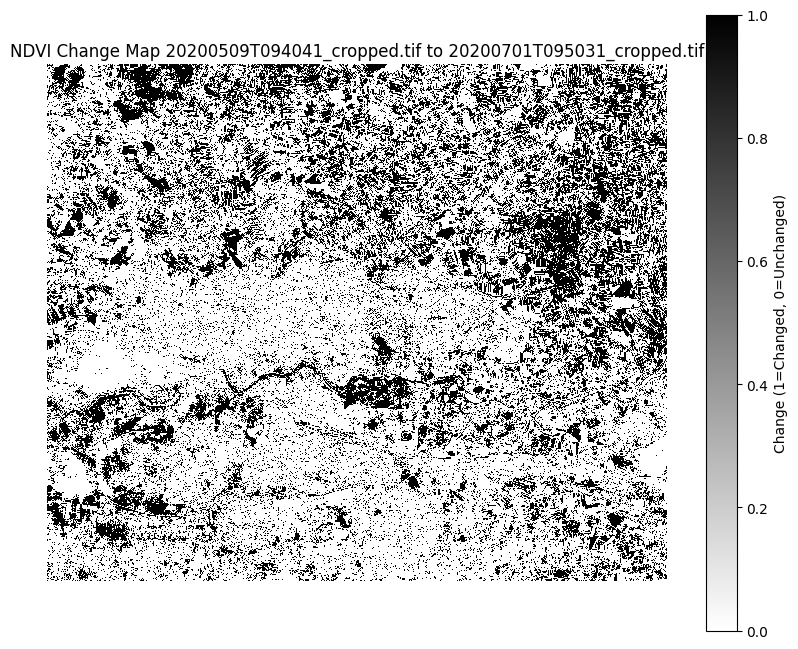

NDVI 20200509T094041_cropped.tif min: -0.8192457556724548, max: 1.0
NDVI 20200701T095031_cropped.tif min: -1.0, max: 1.0
NDVI Difference min: -1.1828665733337402, max: 1.3076324462890625


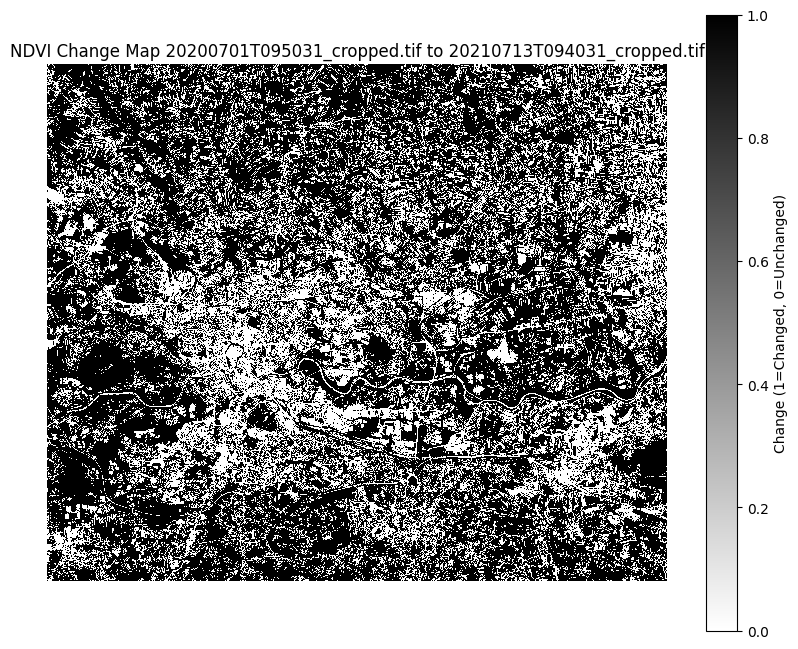

NDVI 20200701T095031_cropped.tif min: -1.0, max: 1.0
NDVI 20210713T094031_cropped.tif min: -0.6935533881187439, max: 0.7605019211769104
NDVI Difference min: -1.250662922859192, max: 1.097861647605896


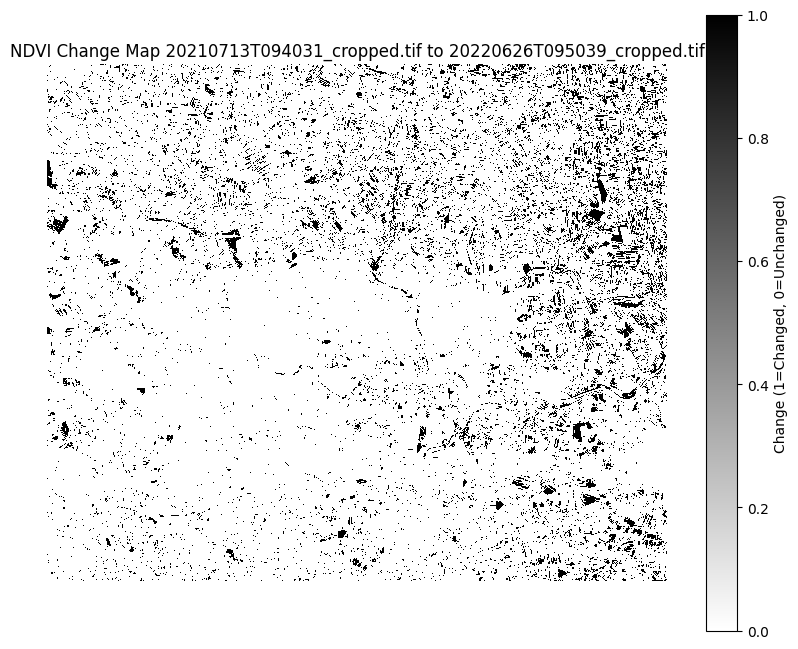

NDVI 20210713T094031_cropped.tif min: -0.6935533881187439, max: 0.7605019211769104
NDVI 20220626T095039_cropped.tif min: -0.7107405662536621, max: 0.7721083760261536
NDVI Difference min: -0.97225022315979, max: 1.0358164310455322


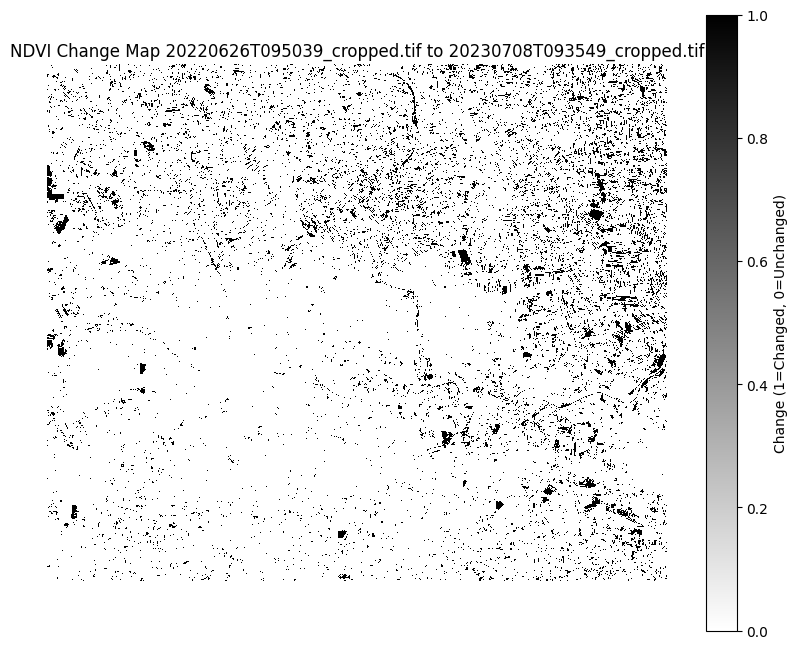

NDVI 20220626T095039_cropped.tif min: -0.7107405662536621, max: 0.7721083760261536
NDVI 20230708T093549_cropped.tif min: -0.6305339932441711, max: 0.7933591604232788
NDVI Difference min: -1.0021755695343018, max: 0.9676717519760132


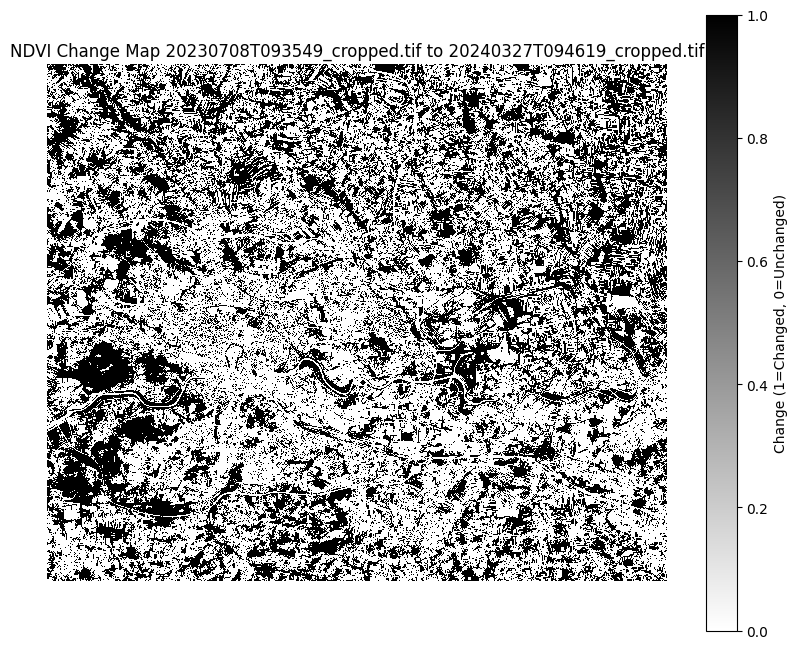

NDVI 20230708T093549_cropped.tif min: -0.6305339932441711, max: 0.7933591604232788
NDVI 20240327T094619_cropped.tif min: -0.7165199518203735, max: 0.847575306892395
NDVI Difference min: -1.0524404048919678, max: 0.9115617275238037


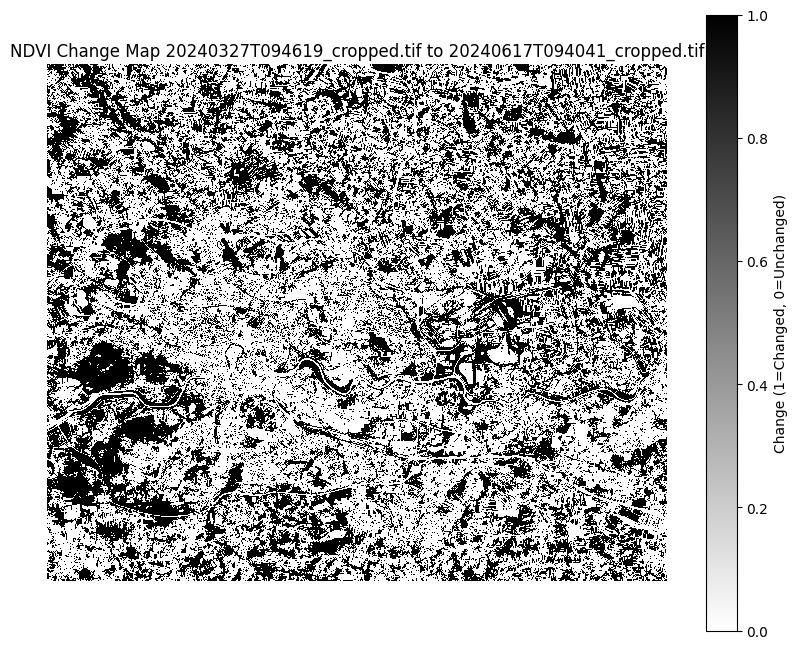

NDVI 20240327T094619_cropped.tif min: -0.7165199518203735, max: 0.847575306892395
NDVI 20240617T094041_cropped.tif min: -0.6572455167770386, max: 0.7649685144424438
NDVI Difference min: -0.789878785610199, max: 1.0506887435913086


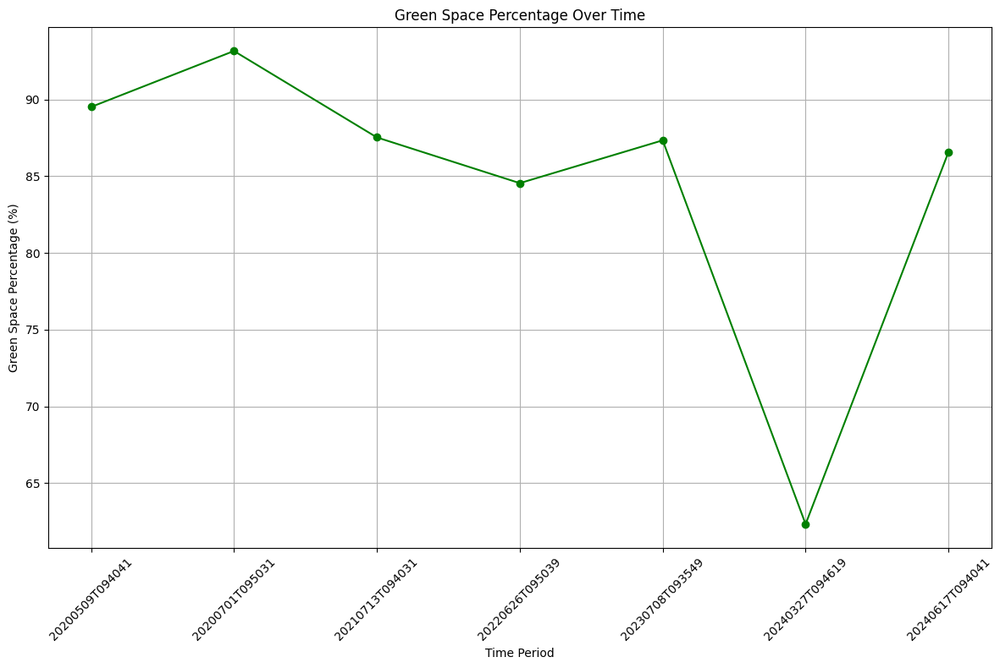

In [9]:


# Define the directory containing the cut images
cut_images_directory = "C:/Users/hamza/Downloads/ImageProcessing/cutImages"

# List all files in the directory
files = os.listdir(cut_images_directory)

# Filter the stacked band images
stacked_band_files = [file for file in files if file.endswith("_cropped.tif")]

# Ensure the list is sorted to match time periods
stacked_band_files.sort()

# Function to calculate NDVI
def calculate_ndvi(red_band, nir_band):
    return (nir_band - red_band) / (nir_band + red_band)

# Function to calculate the percentage of green space
def calculate_green_space_percentage(ndvi, threshold=0.2):
    green_space_pixels = np.sum(ndvi > threshold)
    total_pixels = ndvi.size
    green_space_percentage = (green_space_pixels / total_pixels) * 100
    return green_space_percentage

# Load and calculate NDVI for each time period
ndvi_images = []
green_space_percentages = []
for file in stacked_band_files:
    with rasterio.open(os.path.join(cut_images_directory, file)) as src:
        # Assuming the bands are in order B02, B03, B04, B08, B11, B12
        B04 = src.read(3).astype(np.float32)  # Red band
        B08 = src.read(4).astype(np.float32)  # Near-Infrared band
        ndvi = calculate_ndvi(B04, B08)
        ndvi_images.append(ndvi)
        green_space_percentage = calculate_green_space_percentage(ndvi)
        green_space_percentages.append(green_space_percentage)
        print(f'Green space percentage for {file}: {green_space_percentage:.2f}%')

        # Plot NDVI
        plt.figure(figsize=(10, 10))
        plt.imshow(ndvi, cmap='RdYlGn')
        plt.colorbar()
        plt.title(f'NDVI for {file}')
        plt.axis('off')
        plt.show()

# Perform change detection between consecutive NDVI images
for i in range(len(ndvi_images) - 1):
    ndvi_time_period_1 = ndvi_images[i]
    ndvi_time_period_2 = ndvi_images[i + 1]

    # Calculate NDVI difference
    ndvi_difference = ndvi_time_period_2 - ndvi_time_period_1

    # Apply threshold
    threshold = 0.2
    change_map = np.where(np.abs(ndvi_difference) > threshold, 1, 0)

    # Visualize change map
    plt.figure(figsize=(10, 8))
    plt.imshow(change_map, cmap='binary', interpolation='nearest')
    plt.title(f'NDVI Change Map {stacked_band_files[i]} to {stacked_band_files[i + 1]}')
    plt.colorbar(label='Change (1=Changed, 0=Unchanged)')
    plt.axis('off')
    plt.show()

    # Print the range of NDVI values for debugging
    print(f'NDVI {stacked_band_files[i]} min: {np.min(ndvi_time_period_1)}, max: {np.max(ndvi_time_period_1)}')
    print(f'NDVI {stacked_band_files[i + 1]} min: {np.min(ndvi_time_period_2)}, max: {np.max(ndvi_time_period_2)}')
    print(f'NDVI Difference min: {np.min(ndvi_difference)}, max: {np.max(ndvi_difference)}')

# Visualize green space percentages over time
time_periods = [file.split('_')[0] for file in stacked_band_files]
plt.figure(figsize=(12, 8))  # Increase the figure size
plt.plot(time_periods, green_space_percentages, marker='o', linestyle='-', color='g')
plt.xlabel('Time Period')
plt.ylabel('Green Space Percentage (%)')
plt.title('Green Space Percentage Over Time')
plt.xticks(rotation=45)  # Rotate x-axis labels to prevent overlapping
plt.grid(True)
plt.tight_layout()  # Adjust layout to fit labels better
plt.show()
